# Building Recommender Systems with Spotify Data

In [ ]:
pip install spotipy

     |████████████████████████████████| 138 kB 7.7 MB/s 
     |████████████████████████████████| 62 kB 725 kB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
pip install seaborn

In [ ]:
pip install datapane

     |████████████████████████████████| 2.6 MB 4.8 MB/s 
     |████████████████████████████████| 97 kB 3.4 MB/s 
     |████████████████████████████████| 10.1 MB 32.8 MB/s 
     |████████████████████████████████| 71 kB 114 kB/s 
     |████████████████████████████████| 596 kB 29.0 MB/s 
     |████████████████████████████████| 193 kB 42.4 MB/s 
     |████████████████████████████████| 46 kB 1.9 MB/s 
     |████████████████████████████████| 54 kB 2.2 MB/s 
     |████████████████████████████████| 45 kB 1.5 MB/s 
     |████████████████████████████████| 46 kB 2.1 MB/s 
  Created wheel for face: filename=face-20.1.1-py3-none-any.whl size=51091 sha256=9fc411a1905adf6e8343d2cc553732fd69c3aed0fc9b24dbc1aea93355f0786b
  Stored in directory: /root/.cache/pip/wheels/67/03/c2/76d2e1e694852ce409ac2938b9f461bc0fdf3789901e7bb1f0
  Created wheel for micawber: filename=micawber-0.5.4-py3-none-any.whl size=22373 sha256=1f3f70475cf8d17c6fd0d927dd95d95e37d90e5da7f2f1afcee62df12d914760
  Stored in directory: /

In [ ]:
pip install chart_studio

## Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import spotipy
import datapane as dp
import chart_studio.plotly as py
import chart_studio
import os
'''username = os.environ['PLOTLY_USERNAME']
api_key = os.environ['PLOTLY_API_KEY']
chart_studio.tools.set_credentials_file(username=username, api_key=api_key)'''
plt.rcParams.update({'font.size': 22})
%matplotlib inline

## Reading the Data

In [ ]:
spotify_data = pd.read_csv('data.csv')
genre_data = pd.read_csv('data_by_genres.csv')
data_by_year = pd.read_csv('data_by_year.csv')
spotify_data.head(10)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665
5,0.1960,1921,0.579,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.697,395076,0.346,0,4pyw9DVHGStUre4J6hPngr,0.168000,2,0.130,-12.506,1,Gati Mardika,6,1921,0.0700,119.824
6,0.4060,1921,0.996,['John McCormack'],0.518,159507,0.203,0,5uNZnElqOS3W4fRmRYPk4T,0.000000,0,0.115,-10.589,1,The Wearing of the Green,4,1921,0.0615,66.221
7,0.0731,1921,0.993,['Sergei Rachmaninoff'],0.389,218773,0.088,0,02GDntOXexBFUvSgaXLPkd,0.527000,1,0.363,-21.091,0,"Morceaux de fantaisie, Op. 3: No. 2, Prélude i...",2,1921,0.0456,92.867
8,0.7210,1921,0.996,['Ignacio Corsini'],0.485,161520,0.130,0,05xDjWH9ub67nJJk82yfGf,0.151000,5,0.104,-21.508,0,La Mañanita - Remasterizado,0,1921-03-20,0.0483,64.678
9,0.7710,1921,0.982,['Fortugé'],0.684,196560,0.257,0,08zfJvRLp7pjAb94MA9JmF,0.000000,8,0.504,-16.415,1,Il Etait Syndiqué,0,1921,0.3990,109.378


In [ ]:
spotify_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83900 entries, 0 to 83899
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   valence           83900 non-null  float64
 1   year              83900 non-null  int64  
 2   acousticness      83900 non-null  float64
 3   artists           83900 non-null  object 
 4   danceability      83900 non-null  float64
 5   duration_ms       83900 non-null  int64  
 6   energy            83900 non-null  float64
 7   explicit          83900 non-null  int64  
 8   id                83900 non-null  object 
 9   instrumentalness  83900 non-null  float64
 10  key               83900 non-null  int64  
 11  liveness          83900 non-null  float64
 12  loudness          83900 non-null  float64
 13  mode              83900 non-null  int64  
 14  name              83900 non-null  object 
 15  popularity        83900 non-null  int64  
 16  release_date      83900 non-null  object

In [ ]:
genre_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB


In [ ]:
data_by_year.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB


## Exploratory Data Analysis

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


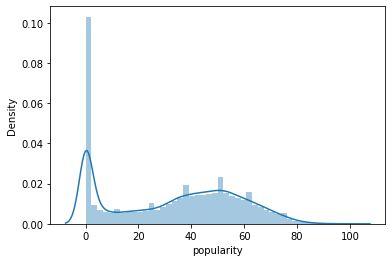

In [ ]:
sns.distplot(spotify_data['popularity'])

### Music Over Time

In [ ]:
def get_decade(year):
    
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    
    return decade

spotify_data['decade'] = spotify_data['year'].apply(get_decade)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


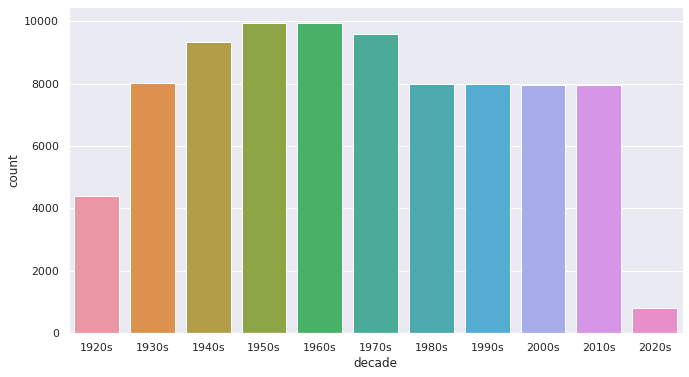

In [ ]:
sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(spotify_data['decade'])

In [ ]:
import plotly.express as px
fig = px.line(data_by_year, x='year', y='tempo')

fig.show()


report = dp.Report(dp.Plot(fig) ) #Create a report
#report.publish(name='music_tempo_over_time', open=True, visibility='PUBLIC') #Publish the report

Bokeh version 2.3.3 is not supported, these plots may not display correctly, please install version ~=2.2.0
Folium version 0.8.3 is not supported, these plots may not display correctly, please install version >=0.12.0


## Clustering Genres

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])

X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [ ]:
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=2))])
genre_embedding = tsne_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.007s...
[t-SNE] Computed neighbors for 2973 samples in 0.322s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] Computed conditional probabilities in 0.134s
[t-SNE] Iteration 50: error = 81.7893829, gradient norm = 0.0268329 (50 iterations in 2.015s)
[t-SNE] Iteration 100: error = 76.4676514, gradient norm = 0.0041192 (50 iterations in 1.355s)
[t-SNE] Iteration 150: error = 76.1726379, gradient norm = 0.0023117 (50 iterations in 1.275s)
[t-SNE] Iteration 200: error = 76.1303253, gradient norm = 0.0005717 (50 iterations in 1.341s)
[t-SNE] Iteration 250: error = 76.1168976, gradient norm = 0.0002102 (50 iterations in 1.309s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.116898
[t-SNE] Iteration 300: erro

In [ ]:
import plotly.express as px

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()


report = dp.Report(dp.Plot(fig) ) #Create a report
#report.publish(name='clustering_genres', open=True, visibility='PUBLIC') #Publish the report

## Clustering Songs

In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=2))], verbose=True) #n_jobs=4
X = spotify_data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
Initialization complete
Iteration 0, inertia 729545.7794019196
Iteration 1, inertia 556994.5527354121
Iteration 2, inertia 532364.5644044715
Iteration 3, inertia 523655.744900243
Iteration 4, inertia 519206.85020857526
Iteration 5, inertia 516486.3256798778
Iteration 6, inertia 514349.89018751425
Iteration 7, inertia 512771.8377676426
Iteration 8, inertia 511635.68730886123
Iteration 9, inertia 510859.6798581892
Iteration 10, inertia 510156.910641257
Iteration 11, inertia 509569.67309553653
Iteration 12, inertia 509039.15661725483
Iteration 13, inertia 508523.16999795823
Iteration 14, inertia 508097.3052642527
Iteration 15, inertia 507771.2344245818
Iteration 16, inertia 507534.0615085239
Iteration 17, inertia 507346.0974649049
Iteration 18, inertia 507159.44445066154
Iteration 19, inertia 506957.6425927958
Iteration 20, inertia 506727.2876064492
Iteration 21, inertia 506444.3048986356
Iteration 22, inertia 506100.7

Pipeline(steps=[('scaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=20, verbose=2))],
         verbose=True)

In [ ]:
song_cluster_labels = song_cluster_pipeline.predict(X)

In [ ]:
spotify_data['cluster_label'] = song_cluster_labels

In [ ]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = spotify_data['name']
projection['cluster'] = spotify_data['cluster_label']

In [ ]:
import plotly.express as px

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()


#report = dp.Report(dp.Plot(fig) ) #Create a report
#report.publish(name='clustering_songs', open=True, visibility='PUBLIC') #Publish the report

## Building a Content-Based Recommender System

In [ ]:
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
from spotipy.oauth2 import SpotifyOAuth

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="cf0ed68e536848da870c979cdcf39ac7",
                                                        client_secret="9e244b94ec3e4551a03be2a55278a4f4"))
'''with open("spotify/spotify_details.yml", 'r') as stream:  
    spotify_details = yaml.safe_load(stream)

sp = spotipy.Spotify(auth_manager=SpotifyOAuth(
    client_id=os.spotify_details['cf0ed68e536848da870c979cdcf39ac7'],
    client_secret=spotify_details['9e244b94ec3e4551a03be2a55278a4f4'],
    redirect_uri=spotify_details['http://localhost:9001/callback'],    
    scope=scope))'''

'with open("spotify/spotify_details.yml", \'r\') as stream:  \n    spotify_details = yaml.safe_load(stream)\n\nsp = spotipy.Spotify(auth_manager=SpotifyOAuth(\n    client_id=os.spotify_details[\'cf0ed68e536848da870c979cdcf39ac7\'],\n    client_secret=spotify_details[\'9e244b94ec3e4551a03be2a55278a4f4\'],\n    redirect_uri=spotify_details[\'http://localhost:9001/callback\'],    \n    scope=scope))'

In [ ]:
def find_song(name, year):
    
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,
                                                       year), limit=1)
    if results['tracks']['items'] == []:
        return None
    
    results = results['tracks']['items'][0]

    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]
    
    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]
    
    for key, value in audio_features.items():
        song_data[key] = value
    
    return pd.DataFrame(song_data)
    

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

def get_song_data(song, spotify_data):
    
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) 
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    
    except IndexError:
        return find_song(song['name'], song['year'])
        

def get_mean_vector(song_list, spotify_data):
    
    song_vectors = []
    
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)

def flatten_dict_list(dict_list):
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict
        

def recommend_songs( song_list, spotify_data, n_songs=10):
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')


In [ ]:
recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Stay Away', 'year': 1993}],  spotify_data)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'artists': "['Rascal Flatts']",
  'name': 'Life is a Highway - From "Cars"',
  'year': 2009},
 {'artists': "['Metallica']", 'name': 'Of Wolf And Man', 'year': 1991},
 {'artists': "['Keith Urban']", 'name': 'Somebody Like You', 'year': 2002},
 {'artists': "['Passion Pit']", 'name': 'Little Secrets', 'year': 2009},
 {'artists': "['Los Fugitivos']", 'name': 'Corazón Mágico', 'year': 1995},
 {'artists': "['Nickelback']",
  'name': 'If Today Was Your Last Day',
  'year': 2008},
 {'artists': "['Def Leppard']", 'name': "Let's Get Rocked", 'year': 1992},
 {'artists': "['Avril Lavigne']",
  'name': "Things I'll Never Say",
  'year': 2002},
 {'artists': "['Rascal Flatts']", 'name': 'Life is a Highway', 'year': 2006},
 {'artists': "['Alice In Chains']", 'name': 'No Excuses', 'year': 1994}]

In [ ]:
recommend_songs([{'name':'Beat It', 'year': 1982},
                 {'name': 'Billie Jean', 'year': 1988},
                 {'name': 'Thriller', 'year': 1982}], spotify_data)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'artists': "['Rod Stewart']", 'name': 'Hot Legs', 'year': 1977},
 {'artists': "['Michael Jackson']",
  'name': 'Thriller - 2003 Edit',
  'year': 2003},
 {'artists': "['Cherrelle']",
  'name': "I Didn't Mean To Turn You On",
  'year': 1984},
 {'artists': "['Talking Heads']",
  'name': 'Take Me to the River - Live',
  'year': 1984},
 {'artists': "['Michael Jackson']",
  'name': 'Thriller - Single Version',
  'year': 2005},
 {'artists': "['Saint Etienne']", 'name': 'Nothing Can Stop Us', 'year': 1992},
 {'artists': "['Talking Heads']",
  'name': "A Clean Break (Let's Work) - Live; 2004 Remaster",
  'year': 1982}]

In [ ]:
recommend_songs([{'name':'Garmi', 'year': 2020},
                 {'name': 'Death Bed', 'year': 2020},
                 {'name': 'Bags', 'year': 2019},
                 {'name':'Slide','year':2017}], spotify_data)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:446: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



[{'artists': "['Dua Lipa']", 'name': 'Break My Heart', 'year': 2020},
 {'artists': "['Migos', 'KAROL G', 'Snoop Dogg', 'Rock Mafia']",
  'name': 'My Family - from "The Addams Family"',
  'year': 2019},
 {'artists': "['Dua Lipa']", 'name': 'Break My Heart', 'year': 2020},
 {'artists': "['Romeo Santos', 'Ozuna']",
  'name': 'Sobredosis (feat. Ozuna)',
  'year': 2017},
 {'artists': "['iKON']", 'name': 'LOVE SCENARIO', 'year': 2018},
 {'artists': "['Kesha']", 'name': 'TiK ToK', 'year': 2010},
 {'artists': "['Marshmello', 'Imanbek', 'Usher']",
  'name': 'Too Much (feat. Usher)',
  'year': 2020},
 {'artists': "['Lennon Stella', 'Charlie Puth']",
  'name': "Summer Feelings (feat. Charlie Puth) - From 'SCOOB!' The Album",
  'year': 2020},
 {'artists': "['Maluma']", 'name': 'Felices los 4', 'year': 2018},
 {'artists': "['Romeo Santos']", 'name': 'Eres Mía', 'year': 2014}]